<center><h1>DIT281 Project 1<br>(itp22104@hua.gr / Anastasios Kotronis)</h1><center>

# Environment setup

- Add `ipykernel==6.27.1` to `requirements.txt` so that we can change kernel in notebook file
- `>>> python -m venv venv` to create virtual environment with name `venv`
- `>>> .\venv\Scripts\activate.ps1` (Windows Powershell) to activate it
- `>>> python -m pip install --upgrade pip` to upgrade `pip` package manager
- `>>> python -m pip install -r requirements.txt`
- Add kernel to jupyter `>>> python -m ipykernel install --user --name=dit281` (`dit281` will appear in jupyter **Kernel → Change kernel** menu and can be a custom name, not necessarily the same as virtual environment name)

# Γενικές βοηθητικές συναρτήσεις

In [1]:
%matplotlib notebook

from pathlib import Path

import cv2
import math
import matplotlib.pyplot as plt
import numpy as np

In [142]:
def load_image_as_gray(image_name, resize_to=None):
    """
    `resize_to` can be a 2-tuple with the new resolution
    """
    image_path = Path.cwd().resolve() / 'images' / image_name
    image = cv2.imread(f'{image_path}', cv2.IMREAD_GRAYSCALE)
    if resize_to:
        image = cv2.resize(image, resize_to)
    return image


def filter_image(image, percentage=1., to_keep_per_dim=None):
    """
    Sample image
    - By a fixed percentage for each dimension or
    - By a tuple of fixed numbers for each dimension
    """
    if to_keep_per_dim is None: 
        rows, cols = image.shape
        # based on percentage
        x, y = int(rows * percentage), int(cols * percentage)
        to_keep_per_dim = (x, y)
    # based on fixed number per dim
    x, y = [k // l for k,l in zip(image.shape, to_keep_per_dim)]

    # Create a mask to identify positions
    mask = np.zeros_like(image, dtype=bool)
    mask[::x, ::y] = True

    # Initialize output array with zeros
    output = np.zeros_like(image)

    # Assign the initial numbers at specified positions
    output[mask] = image[mask]
    return output


def calculate_mse(first_image, last_image):
    return np.mean((first_image - last_image) ** 2)

# Άσκηση #1: Κβάντιση

In [93]:
def uniform_quantizer(input_image, levels):
    # Calculate step from original_image shape
    step = input_image.shape[-1] // levels
    
    # Create a placeholder image with zeros
    quantized_image = np.zeros_like(input_image)

    # Uniform quantization
    for i in range(levels):
        from_, to_ = i * step, (i + 1) * step
        mask = (input_image >= from_) & (input_image < to_)
        quantized_image[mask] = (from_ + to_) // 2
    return quantized_image

    
def quantizer_coords(levels):
    x = np.arange(0, 256)
    step_size = 256 / levels
    y = np.floor(x / step_size) * step_size
    return x, y

<IPython.core.display.Javascript object>


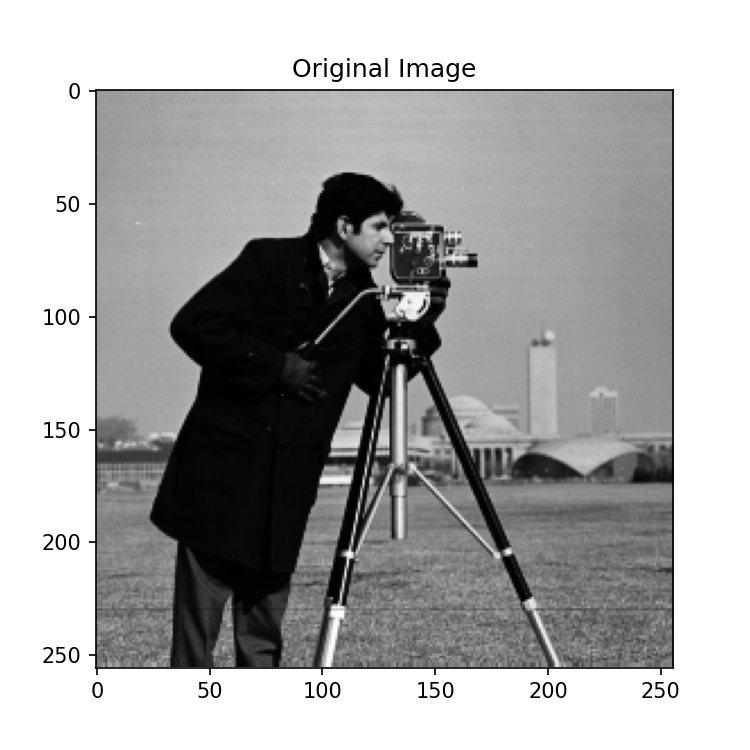

<IPython.core.display.Javascript object>


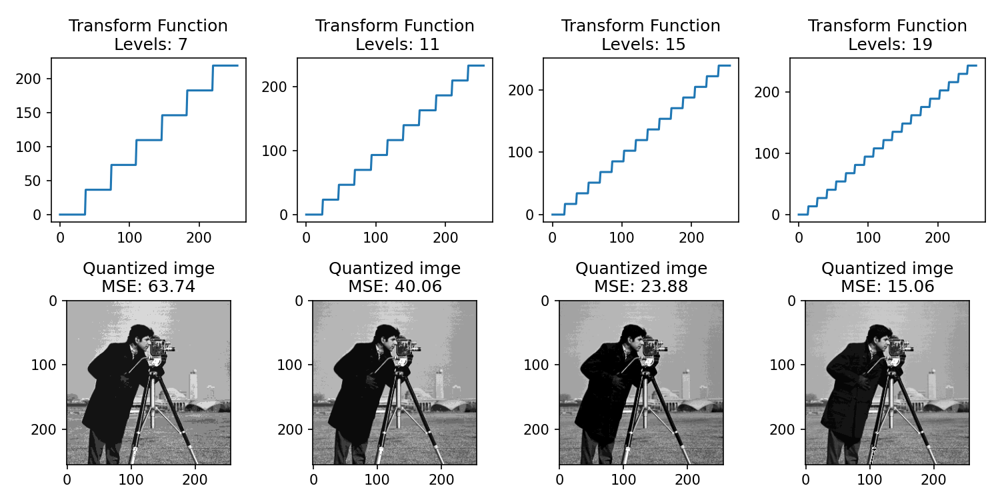

In [98]:
# Load grayscale image
original_image = load_image_as_gray('cameraman.bmp')

# Display original image
plt.figure(figsize=(5, 5))
plt.subplot(1, 1, 1)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')


# # A. Implement and apply uniform quantizers with 7, 11, 15, and 19 levels
quantizer_levels = [7, 11, 15, 19]
levels_cnt = len(quantizer_levels)

grid_x_size = 10
plt.figure(figsize=(grid_x_size, grid_x_size // 2))
for i, levels in enumerate(quantizer_levels):
    quantized_image = uniform_quantizer(original_image, levels)

    # B. Plot quantizer transform function
    x, y = quantizer_coords(levels)
    plt.subplot(2, levels_cnt, i + 1), plt.plot(x, y, label=f'Levels = {levels}')
    plt.title(f'Transform Function\n Levels: {levels}')
    
    mse = calculate_mse(original_image, quantized_image)

    # C. Display quantized images
    plt.subplot(2, levels_cnt, levels_cnt + i + 1), plt.imshow(quantized_image, cmap='gray')
    plt.title(f'Quantized imge\nMSE: {mse:.2f}')

# Display the plots
plt.tight_layout()
plt.show()

Παρατηρούμε ότι με την αύξηση των επιπέδων του κβαντιστή η ποιότητα της εικόνας βελτιώνεται και πλησιάζει την αρχική κάτι που συμβαδίζει και με τη μείωση του σφάλματος

# Άσκηση #2: Μετασχηματισμός Fourier

In [ ]:
%matplotlib notebook
import cv2
import numpy as np
import matplotlib.pyplot as plt

<IPython.core.display.Javascript object>


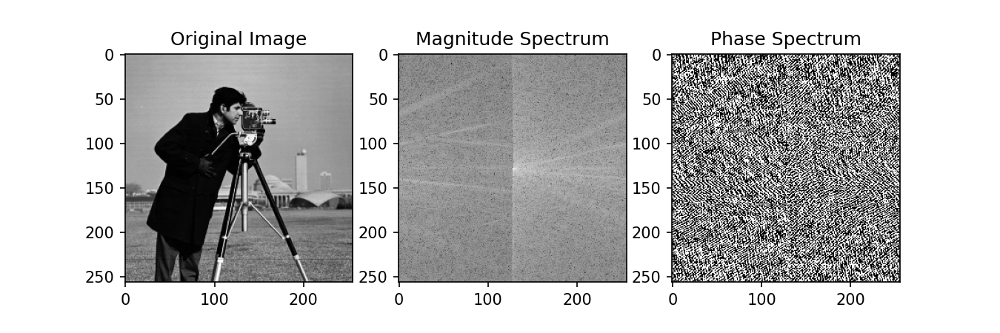

<IPython.core.display.Javascript object>


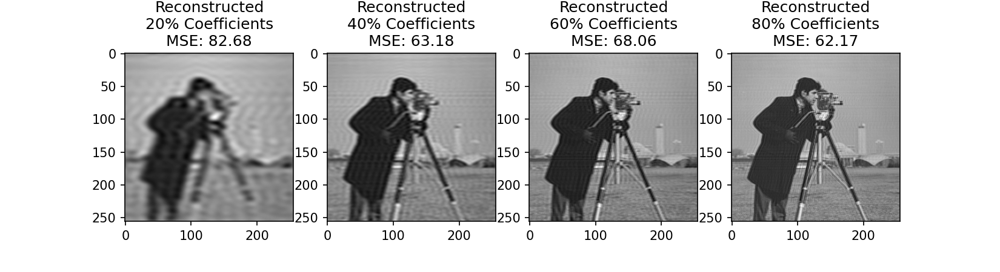

In [212]:
# Load image
original_image = load_image_as_gray('cameraman.bmp')

# Perform 2D Fourier Transform (DFT)
dft = cv2.dft(np.float32(original_image))

# Shift zero frequency component (Direct Current - DC) from top left to the center
dft_shift = np.fft.fftshift(dft)

# Apply log function to highlighting details across
# wide magnitude ranges and make magnitude lighter
magnitude_spectrum = np.log(np.abs(dft_shift))

# Calculate phase spectrum in radians
phase_spectrum = np.angle(dft_shift)

# Display original image, magnitude spectrum, and phase spectrum
grid_x_size = 9
plt.figure(figsize=(grid_x_size, grid_x_size // 3))
plt.subplot(131), plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.subplot(132), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')
plt.subplot(133), plt.imshow(phase_spectrum, cmap='gray')
plt.title('Phase Spectrum')
plt.show()

# Reconstruct images with 20%, 40%, 60%, and 80% coefficients
percentages = [0.2, 0.4, 0.6, 0.8]
percentages_cnt = len(percentages)

grid_x_size = 11
plt.figure(figsize=(grid_x_size, grid_x_size // 4 + 1))

for i, percentage in enumerate(percentages):
    # Apply the mask to the shifted DFT
    dft_shift_filtered = filter_image(dft_shift, percentage)
    # Shift zero frequency component (DC) back fom the center to top left
    dft_shift_filtered_back = np.fft.ifftshift(dft_shift_filtered)
    # Perform the inverse Fourier Transform
    reconstructed_image = cv2.idft(dft_shift_filtered_back)

    # Normalize reconstructed image
    reconstructed_image = cv2.normalize(
        reconstructed_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U
    )
    
    mse = calculate_mse(original_image, reconstructed_image)

    plt.subplot(1, percentages_cnt, i + 1), plt.imshow(reconstructed_image, cmap='gray')
    plt.title(f'Reconstructed\n{int(percentage * 100)}% Coefficients\nMSE: {mse:.2f}')

plt.show()

Παρατηρούμε ότι με την αύξηση του ποσοστού των συντελεστών η ποιότητα της ανακατασκευασμένης εικόνας βελτιώνεται και πλησιάζει την αρχική κάτι που συμβαδίζει και με τη μείωση του σφάλματος

# Άσκηση #3: Μετασχηματισμός συνημίτονου

In [138]:
def dct(image):
    """
    Discrete cosine transform
    """
    rows, cols = image.shape
    result = np.zeros((rows, cols))
    auf = lambda u: math.pow(rows, -0.5) if u == 0 else math.pow(2 / rows, -0.5) 
    avf = lambda v: math.pow(cols, -0.5) if v == 0 else math.pow(2 / cols, -0.5) 
    for u in range(rows):
        for v in range(cols):
            sum_value = 0
            for m in range(rows):
                for n in range(cols):
                    sum_value += (
                        image[m, n] * 
                        np.cos(np.pi / rows * (m + 0.5) * u) * 
                        np.cos(np.pi / cols * (m + 0.5) * v)
                    )
            result[u, v] = auf(u) * avf(v) * sum_value
    return result


def idct(image):
    """
    Inverse Discrete cosine transform
    """
    rows, cols = image.shape
    result = np.zeros((rows, cols))
    auf = lambda u: math.pow(rows, -0.5) if u == 0 else math.pow(2 / rows, -0.5) 
    avf = lambda v: math.pow(cols, -0.5) if v == 0 else math.pow(2 / cols, -0.5) 
    for m in range(rows):
        for n in range(cols):
            sum_value = 0
            for u in range(rows):
                for v in range(cols):
                    sum_value += (
                        auf(u) * avf(v) * image[u, v] * 
                        np.cos(np.pi / rows * (m + 0.5) * u) * 
                        np.cos(np.pi / cols * (m + 0.5) * v)
                    )
            result[u, v] = sum_value
    return result

<IPython.core.display.Javascript object>


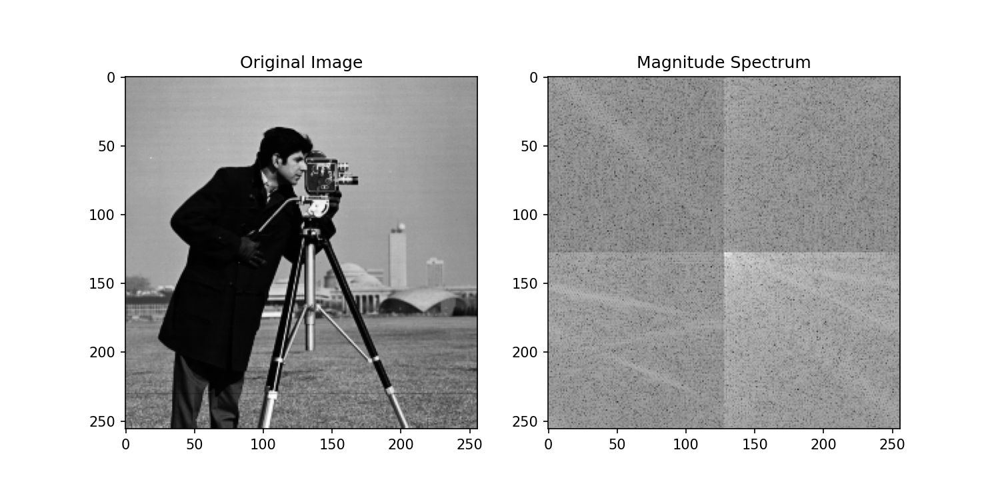

In [148]:
original_image = load_image_as_gray('cameraman.bmp')

# Perform 2D Cosine Transform (DCT)
dct_transformed = dct(np.float32(original_image))
dct_shift = np.fft.fftshift(dct_transformed)

# Apply log function to highlighting details across
# wide magnitude ranges and make magnitude lighter
magnitude_spectrum = np.log(np.abs(dct_shift))

# Display original image, magnitude spectrum, and phase spectrum
plt.figure(figsize=(10, 5))

plt.subplot(121), plt.imshow(original_image, cmap='gray')
plt.title('Original Image')

plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')

plt.show()

<IPython.core.display.Javascript object>


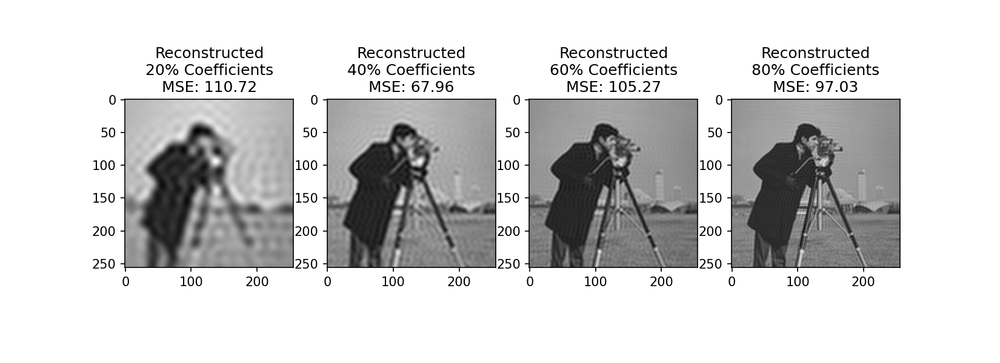

In [152]:
# Reconstruct images with 20%, 40%, 60%, and 80% coefficients and plot
percentages = [0.2, 0.4, 0.6, 0.8]
percentages_cnt = len(percentages)

grid_x_size = 11
plt.figure(figsize=(grid_x_size, grid_x_size // 4 + 2))

for i, percentage in enumerate(percentages):
    # Apply the mask to the input_image image
    dct_shift_filtered = filter_image(dct_shift, percentage)
    
    dct_shift_filtered_back = np.fft.fftshift(dct_shift_filtered)

    # Perform the inverse Cosine Transform
    reconstructed_image = idct(dct_transformed_filtered)

    # Normalize reconstructed image
    reconstructed_image = cv2.normalize(
        reconstructed_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U
    )
    mse = calculate_mse(original_image, reconstructed_image)

    plt.subplot(1, percentages_cnt, i + 1), plt.imshow(reconstructed_image, cmap='gray')
    plt.title(f'Reconstructed\n{int(percentage*100)}% Coefficients\nMSE: {mse:.2f}')

plt.show()

Παρατηρούμε ότι με την αύξηση του ποσοστού των συντελεστών η ποιότητα της ανακατασκευασμένης εικόνας βελτιώνεται και πλησιάζει την αρχική.

# Άσκηση #4: Φιλτράρισμα στο πεδίο του χώρου

In [209]:
def add_salt_and_pepper_noise(image, density):
    noisy_image = image.copy()
    total_pixels = image.size
    num_noisy_pixels = int(density * total_pixels)

    # Add white and black pixels to random indices from
    # the discrete uniform distribution per coordinate
    # Add 'salt' noise (white pixels)
    salt_coordinates = [np.random.randint(0, i - 1, num_noisy_pixels) for i in image.shape]
    noisy_image[tuple(salt_coordinates)] = 255

    # Add 'pepper' noise (black pixels)
    pepper_coordinates = [np.random.randint(0, i - 1, num_noisy_pixels) for i in image.shape]
    noisy_image[tuple(pepper_coordinates)] = 0
    return noisy_image


def apply_mean_filter(image, filter_size):
    # https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html
    return cv2.blur(image, (filter_size, filter_size))

<IPython.core.display.Javascript object>


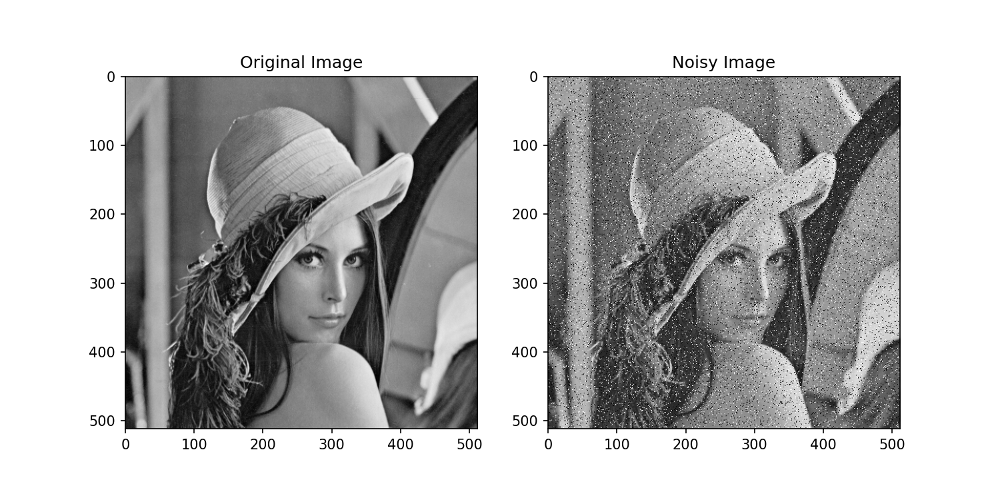

<IPython.core.display.Javascript object>


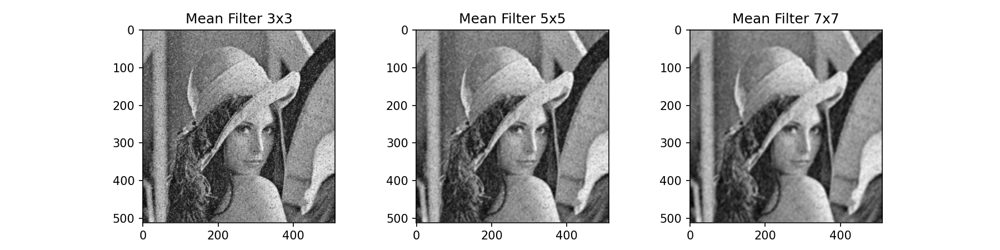

In [211]:
# Load image
original_image = load_image_as_gray('lenna.bmp')

# Add noise
noise_density = 0.05
noisy_image = add_salt_and_pepper_noise(original_image, noise_density)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')

plt.show()

# B. Apply successive mean filters (3x3, 5x5, and 7x7)
filter_sizes = [3, 5, 7]
filtered_images = [apply_mean_filter(noisy_image, size) for size in filter_sizes]

# C. Print the filtered images and compare with the original image
plt.figure(figsize=(12, 3))

for i, size in enumerate(filter_sizes):
    plt.subplot(1, len(filter_sizes), i + 1)
    plt.imshow(filtered_images[i], cmap='gray')
    plt.title(f'Mean Filter {size}x{size}')

plt.show()

Παρατηρούμε ότι με την αύξηση των διαστάσεων στα φίλτρα ο θόρυβος αφαιρείται με μεγαλύτερη επιτυχία, εις βάρος ωστόσο της ευκρίνειας καθώς η εικόνα θολώνει

# Άσκηση #5: Φιλτράρισμα στο πεδίο της συχνότητας

<IPython.core.display.Javascript object>


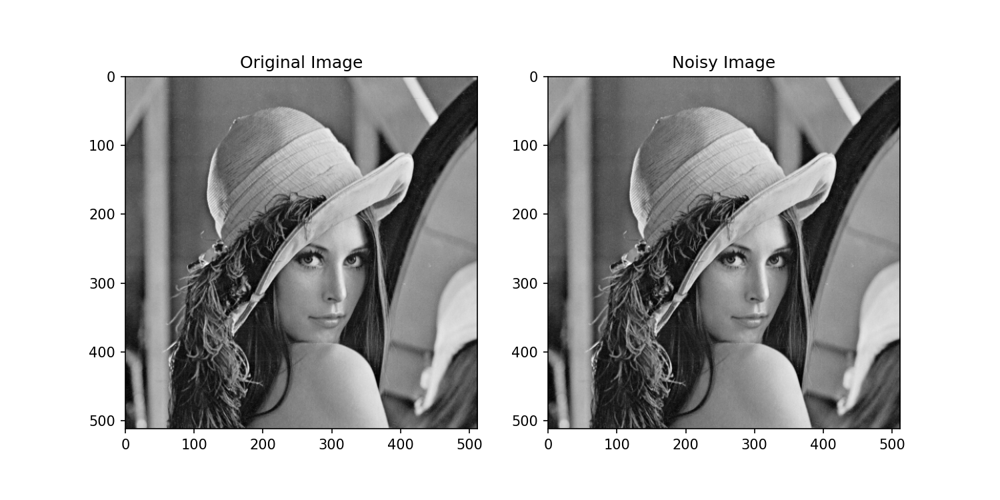

<IPython.core.display.Javascript object>


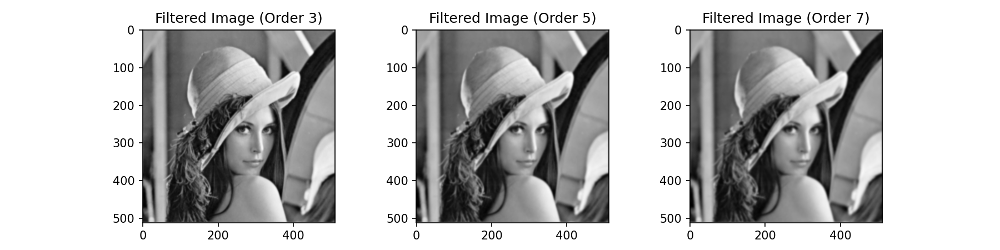

In [267]:
# Load image
original_image = load_image_as_gray('lenna.bmp')

# Add Gaussian noise with mean 0 and variance 0.01
noise = np.random.normal(0, 0.01, original_image.shape)
noisy_image = original_image + noise

plt.figure(figsize=(10, 5))

# Display the original and noisy images
plt.subplot(1, 2, 1)
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(noisy_image, cmap='gray')
plt.title('Noisy Image')
plt.show()

# Apply Butterworth filters
orders = [3, 5, 7]
plt.figure(figsize=(12, 3))

# Apply Fourier Transform
f_transform = np.fft.fft2(noisy_image)
rows, cols = noisy_image.shape

for i, order in enumerate(orders):
    # Create Butterworth filter
    center = (rows // 2, cols // 2)
    butterworth_filter = 1 / (1 + 
                             ((np.fft.fftshift(np.mgrid[:rows, :cols][0]) - center[0]) ** 2 +
                              (np.fft.fftshift(np.mgrid[:rows, :cols][1]) - center[1]) ** 2) /
                              (center[0] * center[1] / 4)
                             ) ** order

    # Apply the filter
    f_transform_filtered = f_transform * butterworth_filter
    
    # Apply Inverse Fourier Transform
    filtered_image = np.fft.ifft2(f_transform_filtered).real
    
    plt.subplot(1, len(orders), i + 1)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(f'Filtered Image (Order {order})')
plt.show()

Παρατηρούμε ότι με την αύξηση της τάξης στα φίλτρα ο θόρυβος αφαιρείται με μεγαλύτερη επιτυχία, εις βάρος ωστόσο της ευκρίνειας καθώς η εικόνα θολώνει

# Άσκηση #6: Τμηματοποίηση εικόνας

In [150]:
from __future__ import annotations
from typing import Union, Optional
import numpy as np


class MeanShift:
    
    def __init__(self, radius=20, radius_norm_step=50):
        self.radius = radius
        self.radius_norm_step = radius_norm_step

    def fit(self, data):
        centroids = dict(enumerate(data))
        weights = list(range(self.radius_norm_step)[::-1])
        while True:
            new_centroids = []
            for i in centroids:
                in_bandwidth = []
                centroid = centroids[i]

                for featureset in data:
                    distance = np.linalg.norm(featureset - centroid) or 0.00000000001
                    weight_index = min(int(distance / self.radius), self.radius_norm_step - 1)
                    to_add = (weights[weight_index] ** 2) * [featureset]
                    in_bandwidth += to_add

                new_centroid = np.average(in_bandwidth, axis=0)
                new_centroids.append(tuple(new_centroid))

            uniques = sorted(list(set(new_centroids)))
            to_pop = []
            for i in uniques:
                for ii in [i for i in uniques]:
                    if i == ii:
                        pass
                    elif np.linalg.norm(np.array(i) - np.array(ii)) <= self.radius:
                        to_pop.append(ii)
                        break

            for i in to_pop:
                try:
                    uniques.remove(i)
                except:
                    pass

            prev_centroids = dict(centroids)
            centroids = {}
            centroids = {i:np.array(v) for i,v in enumerate(uniques)}

            optimized = True

            for i in centroids:
                if not np.array_equal(centroids[i], prev_centroids[i]):
                    optimized = False

            if optimized:
                break

        self.centroids = centroids
        return self

    
    def predict(self, data):
        classifications = []
        for row in data:
            distances = [np.linalg.norm(row - self.centroids[centroid]) for centroid in self.centroids]
            classification = (distances.index(min(distances)))
            classifications.append(classification)
        return classifications

In [156]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def mean_shift(file, max_iterations, eps, spatial_window, color_window):
    # Load the image
    image_path = f"{Path.cwd().resolve() / 'images' / file}"
    image = cv2.imread(image_path)

    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # # Convert to CIELAB color space
    image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    # Define Mean Shift parameters
    mean_shift_params = {
        'sp': spatial_window,
        'sr': color_window,
        'termcrit':(cv2.TERM_CRITERIA_MAX_ITER, max_iterations, eps)
    }

    # Apply Mean Shift segmentation
    mean_shift_result = cv2.pyrMeanShiftFiltering(image, **mean_shift_params)
    mean_shift_result_gray = cv2.cvtColor(mean_shift_result, cv2.COLOR_BGR2GRAY)

    num_shades_of_gray = len(np.unique(mean_shift_result_gray))
    print(f"Number of different shades of gray: {num_shades_of_gray}")

    # Display the results
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mean_shift_result_gray, cmap='gray')
    plt.title("Mean Shift Segmentation")
    plt.axis("off")

    plt.show()

Διαφορετικές τιμές για *r, d και T*

Αρχικές τιμές

Number of different shades of gray: 48


<IPython.core.display.Javascript object>


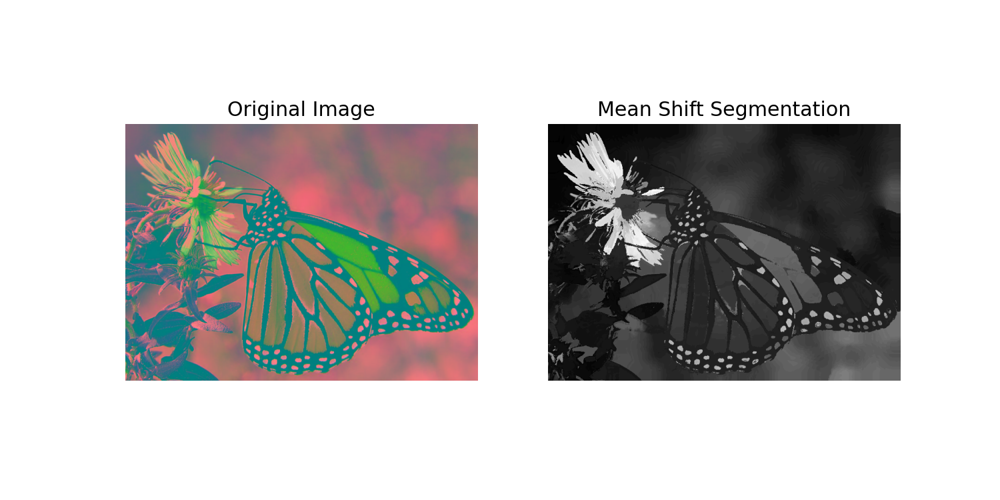

In [157]:
mean_shift(
    file='butterfly.jpg',
    max_iterations=50, # T
    eps=0.2,
    spatial_window=20, # r
    color_window=40    # d
)

Χαμηλότερο *r* οδηγεί σε περισσότερες αποχρώσεις

Number of different shades of gray: 52


<IPython.core.display.Javascript object>


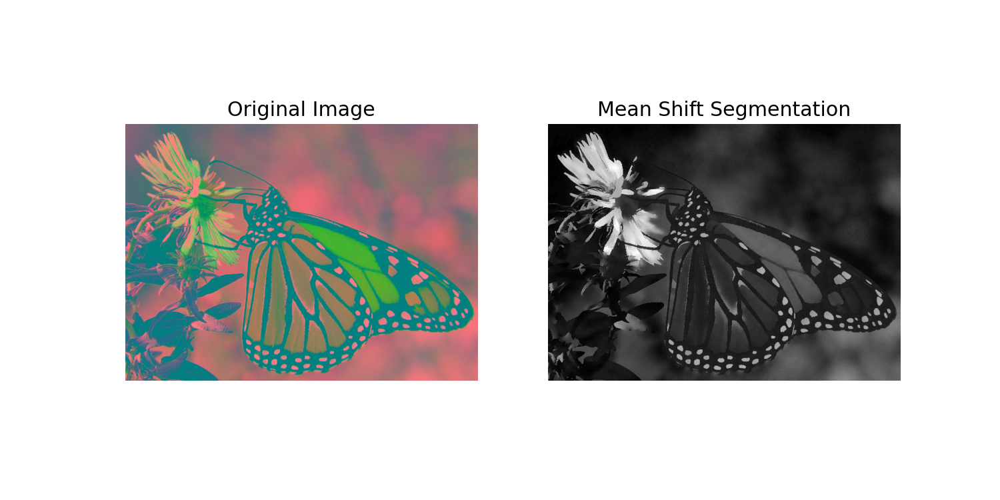

In [160]:
mean_shift(
    file='butterfly.jpg',
    max_iterations=50, # T
    eps=0.2,
    spatial_window=5, # r
    color_window=40   # d
)

Χαμηλότερο *d* οδηγεί σε περισσότερες αποχρώσεις

Number of different shades of gray: 60


<IPython.core.display.Javascript object>


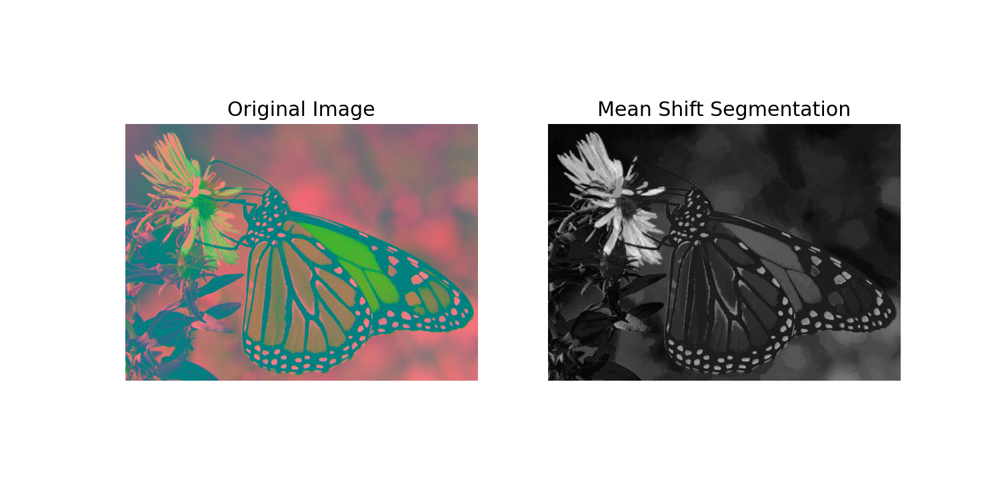

In [161]:
mean_shift(
    file='butterfly.jpg',
    max_iterations=50, # T
    eps=0.2,
    spatial_window=20, # r
    color_window=5     # d
)

# Άσκηση #7: Ανίχνευση ακμών

In [3]:
def prewitt(src):
    kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)
    kernel_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]], dtype=np.float32)

    gradient_x = cv2.filter2D(src, cv2.CV_64F, kernel_x)
    gradient_y = cv2.filter2D(src, cv2.CV_64F, kernel_y)

    edges = np.sqrt(gradient_x**2 + gradient_y**2)
    # Normalize the edges to the range [0, 255]
    edges = ((edges / np.max(edges)) * 255)
    return edges

def LoG(src, ddepth, ksize, sigmaX):
    edges = cv2.GaussianBlur(src, ksize=(5, 5), sigmaX=variance)
    edges = cv2.Laplacian(edges, cv2.CV_64F)
    return edges


def apply_edge_detection(image, method, threshold=None, variance=None):
    # Apply the specified edge detection method
    dispatcher = {
        'sobel':{
            'function':cv2.Sobel, 'kwargs':{'src':image, 'ddepth':cv2.CV_64F, 'dx':1, 'dy':1, 'ksize':3}
        },
        'roberts':{
            'function':cv2.filter2D, 'kwargs':{
                'src':image, 'ddepth':cv2.CV_64F, 'kernel':np.array([[1, 0], [0, -1]])
            }
        },
        'prewitt':{'function':prewitt, 'kwargs':{'src':image}},
        'kirsch':{
            'function':cv2.filter2D,
            'kwargs':{
                'src':image, 'ddepth':cv2.CV_64F, 'kernel':np.array([[5, 5, 5], [-3, 0, -3], [-3, -3, -3]])
            }
        },
        'log':{
            'function':LoG,
            'kwargs':{'src':image, 'ddepth':cv2.CV_64F, 'ksize':(5, 5), 'sigmaX':variance}
        },
        'canny':{
            'function':cv2.Canny,
            'kwargs':{'image':image, 'threshold1':100, 'threshold2':200}
        }
    }
    function = dispatcher[method]['function']
    kwargs = dispatcher[method]['kwargs']
    edges = function(**kwargs)
        
    # Apply global thresholding using Otsu's method for 'sobel', 'roberts', 'prewitt' methods
    if method in ['sobel', 'roberts', 'prewitt']:
        _, edges = cv2.threshold(np.abs(edges).astype(np.uint8), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    elif method in ['kirsch', 'log'] and threshold is not None:
        _, edges = cv2.threshold(np.abs(edges).astype(np.uint8), threshold, 255, cv2.THRESH_BINARY)
    return edges.astype(np.uint8)

In [5]:
# Load the images
butterfly_image = load_image_as_gray('butterfly_g.jpg')
cameraman_image = load_image_as_gray('cameraman.bmp')
lenna_image = load_image_as_gray('lenna.bmp')

Υπολογισμός ακμών με χρήση μεθόδων ***Sobel, Roberts και Prewitt*** και καθολικής κατωφλίωσης του ***Otsu***

<IPython.core.display.Javascript object>


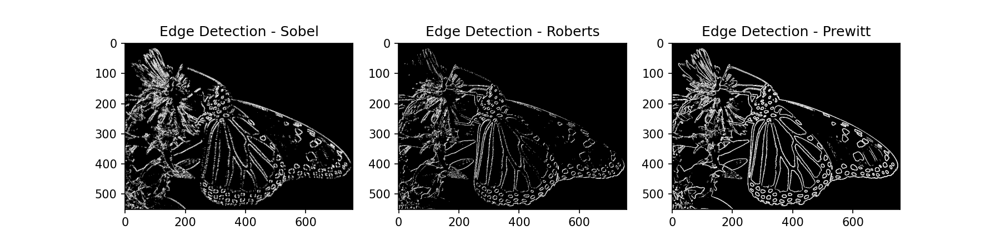

In [60]:
plt.figure(figsize=(12, 3))

# Edge detection using Sobel, Roberts, Prewitt, and Kirsch
edge_methods = ['sobel', 'roberts', 'prewitt']
for i, method in enumerate(edge_methods):
    edges = apply_edge_detection(butterfly_image, method)
    plt.subplot(1, len(edge_methods), i + 1)
    plt.imshow(edges, cmap='gray')
    plt.title(f'Edge Detection - {method.title()}')
    plt.show()

Υπολογισμός ακμών με χρήση μεθόδου του ***Kirsch*** και σύγκριση διαφορετικών τιμών κατωφλίου (*20, 30, 40, 50*)

<IPython.core.display.Javascript object>


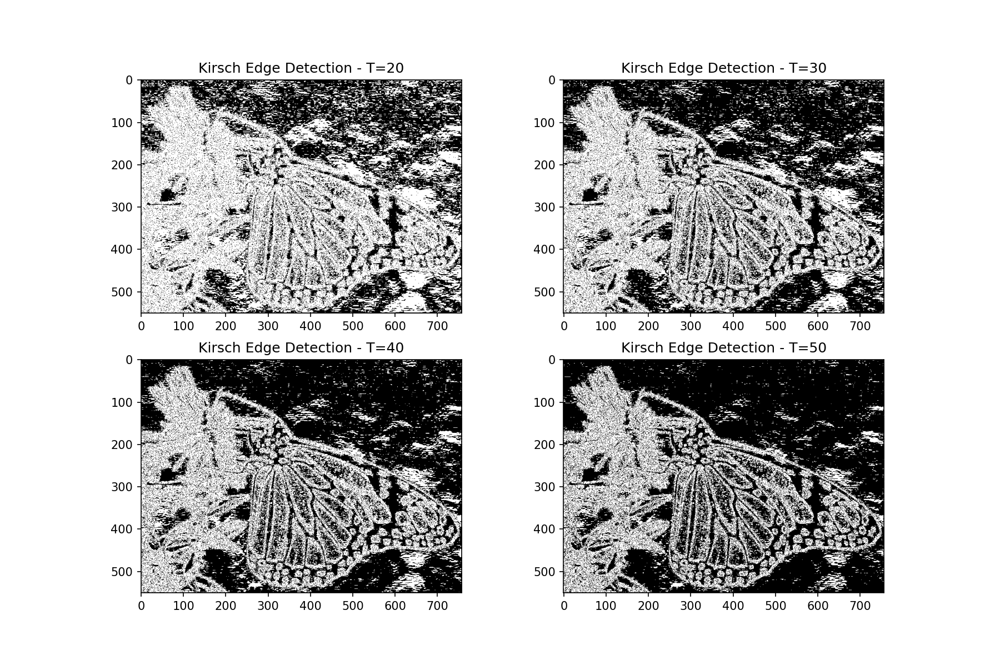

In [69]:
grid_x_size = 12
plt.figure(figsize=(grid_x_size, grid_x_size // 2 + 2))

# Edge detection using Sobel, Roberts, Prewitt, and Kirsch
thresholds = [20, 30, 40, 50]
num_thresholds = len(thresholds)
num_cols = num_thresholds // 2

for i, threshold in enumerate(thresholds):
    edges = apply_edge_detection(butterfly_image, 'kirsch', threshold)
    plt.subplot(2, num_cols, i + 1)
    plt.imshow(edges, cmap='gray')
    plt.title(f'Kirsch Edge Detection - T={threshold}')
    plt.show()

Μια "καλή" τιμή για τη μέθοδο του ***Kirsch*** δείχνει να είναι το `T=50` ενώ μεταξυ των 4ων μεθόδων η ακριβέστερη φαίνεται να είναι αυτή του ***Prewitt***

Υπολογισμός ακμών με χρήση φίλτρου ***LoG*** και σύγκριση διαφορετικών τιμών διακύμανσης και του κατωφλίου

<IPython.core.display.Javascript object>


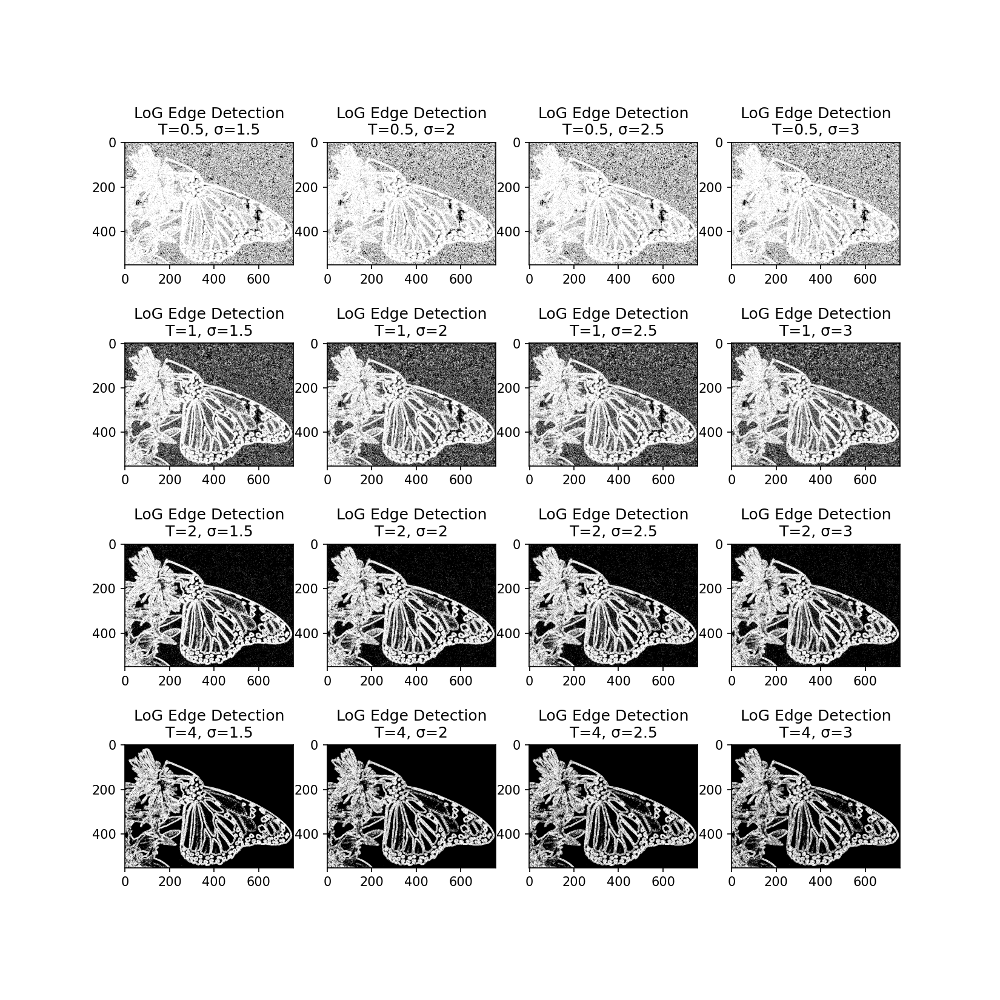

In [6]:
grid_x_size = 11
plt.figure(figsize=(grid_x_size, grid_x_size))

# Edge detection using Sobel, Roberts, Prewitt, and Kirsch
thresholds = [0.5, 1, 2, 4]
variances = [1.5, 2, 2.5, 3]
num_thresholds = len(thresholds)
num_rows = len(thresholds)

for i, threshold in enumerate(thresholds):
    for j, variance in enumerate(variances):
        position = i * len(variances) + j + 1
        edges = apply_edge_detection(butterfly_image, 'log', threshold, variance)
        plt.subplot(num_rows, len(variances), position)
        plt.imshow(edges, cmap='gray')
        plt.title(f'LoG Edge Detection\nT={threshold}, σ={variance}')
        plt.show()

"Καλές" τιμές για την ***LoG*** φαίνονται να είναι το `T=4` ενώ οι συνδυασμοί αυτής της τιμής με τις διαφορετικές τιμές του $\sigma=1.5, 2, 2.5, 3$ δείχνουν να έχουν παρόμοια καλό αποτέλεσμα.

Υπολογισμός ακμών με χρήση της μεθόδου του ***Canny***

<IPython.core.display.Javascript object>


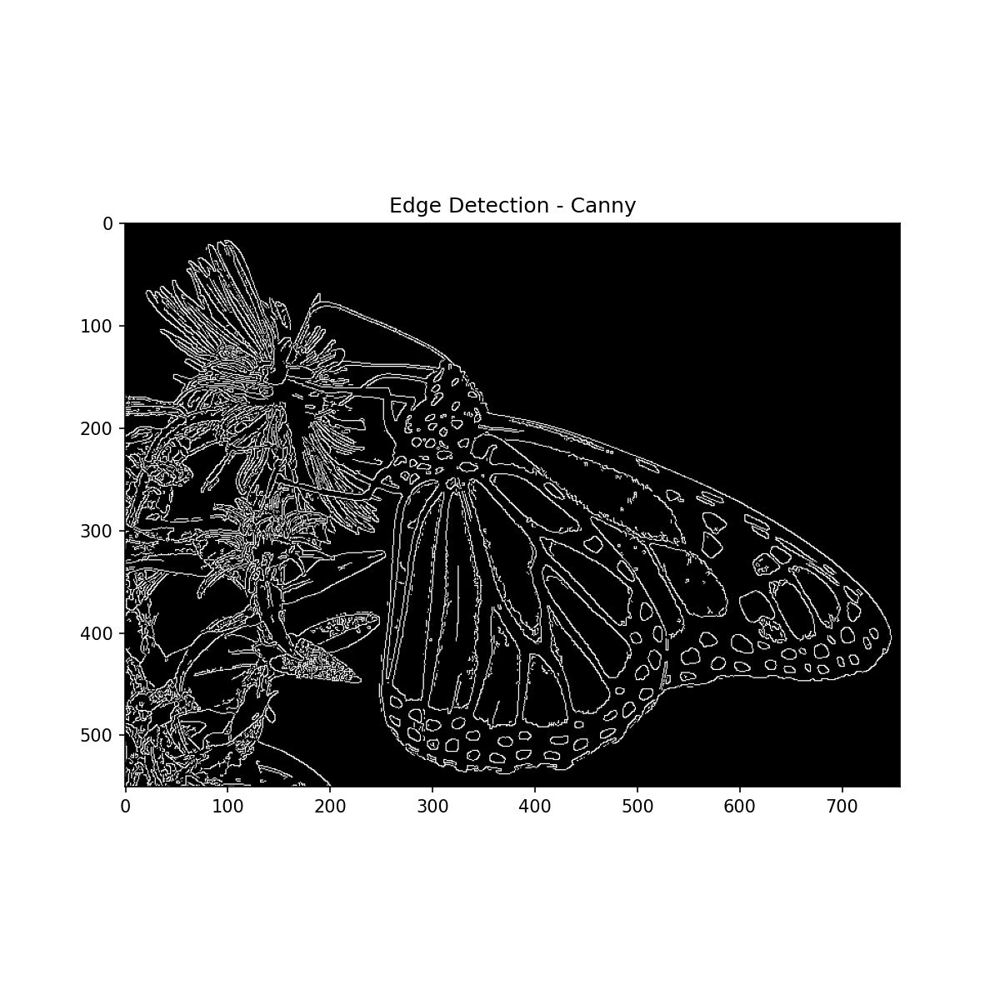

In [7]:
# Edge detection using Canny
butterfly_edges_canny = apply_edge_detection(butterfly_image, 'canny')
plt.figure(figsize=(8, 8))
plt.subplot(1, 1, 1)
plt.imshow(butterfly_edges_canny, cmap='gray')
plt.title('Edge Detection - Canny')
plt.show()

Η μέθοδος του ***Canny*** δείχνει να είναι η ακριβέστερη

Βέλτιστες παράμετροι για το mean shift

Number of different shades of gray: 29


<IPython.core.display.Javascript object>


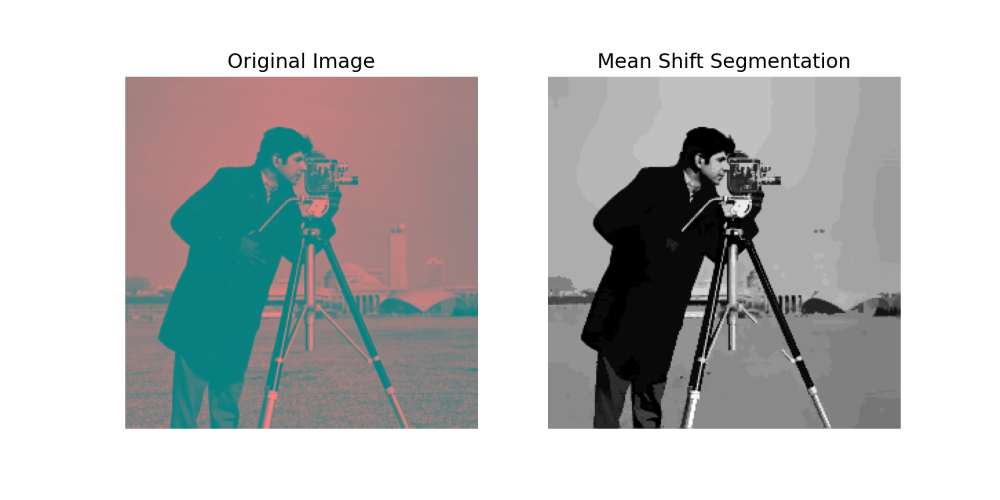

In [170]:
mean_shift(
    file='cameraman.bmp',
    max_iterations=50, # T
    eps=0.2,
    spatial_window=15, # r
    color_window=20    # d
)

Number of different shades of gray: 26


<IPython.core.display.Javascript object>


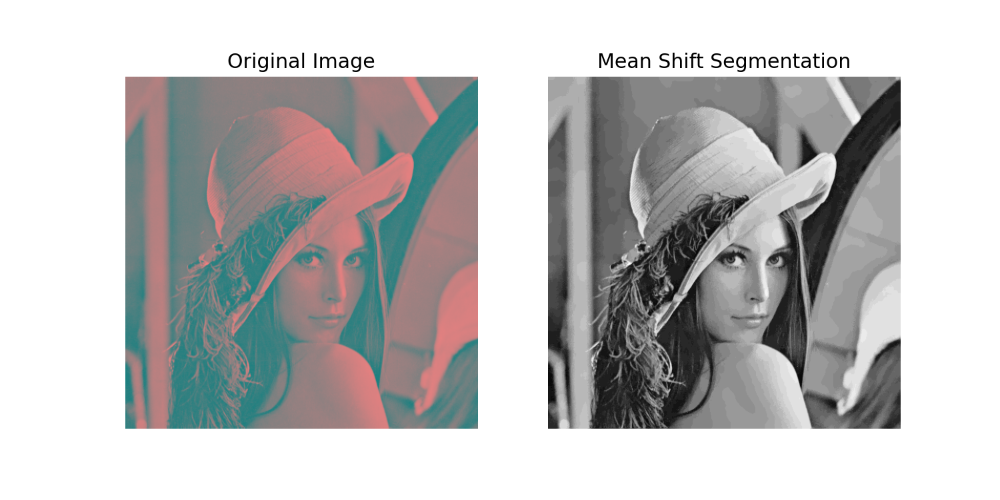

In [179]:
mean_shift(
    file='lenna.bmp',
    max_iterations=50, # T
    eps=0.2,
    spatial_window=5, # r
    color_window=5    # d
)

# Άσκηση #8: Εξαγωγή χαρακτηριστικών για ανάκτηση εικόνων

In [101]:
from pathlib import Path
import random
import itertools
from skimage import feature
import numpy as np

In [ ]:
# Norm implementation

def manhattan_norm(x, y):
    return np.sum(abs(x - y))

def euclidean_norm(x, y):
    return np.sqrt(np.sum((x - y) ** 2))

In [287]:
class ImageDatabase:
    char_names = ['a1', 'a2']
    metric_names = ['b1', 'b2']
    database_items = []
    
    def __init__(self, path):
        self.path = path
        self.name = self.path.name
        self.category = '_'.join(self.name.split('_')[:-1])
        self.image = load_image_as_gray(self.path)
        self.a1 = self.extract_features(self.image, self.char_names[0])
        self.a2 = self.extract_features(self.image, self.char_names[1])
        self.__class__.database_items.append(self)
        print(len(self.__class__.database_items), end=' ')
    
    @classmethod
    def get_item_by_path(cls, path):
        return next(iter([item for item in cls.database_items if item.path == path]), None)
        
    # Function to extract features from an image
    def extract_features(self, image, char_name):
        # Feature extraction - A1: Normalized brightness histogram
        if char_name == 'a1':
            hist_brightness, _ = np.histogram(image.flatten(), bins=256, range=[0,256], density=True)
            return hist_brightness
        elif char_name == 'a2':
            # Feature extraction - A2: Normalized LBP histogram
            lbp = feature.local_binary_pattern(image, P=8, R=5)
            hist_lbp, _ = np.histogram(lbp.flatten(), bins=256, range=[0,256], density=True)
            return hist_lbp
        
    # Function to compute similarity metrics
    def similarity_metric(self, x, y, metric_name):
        if metric_name == 'b1':
            return manhattan_norm(x, y)
        elif metric_name == 'b2':
            return euclidean_norm(x, y)

    # Function to perform image retrieval
    def image_retrieval(self, char_name, metric_name):
        results = []
        
        # Exclude self for similarity comparison
        to_compare_with = [item for item in self.database_items if item.path != self.path]
        
        for db_item in to_compare_with:
            similarity = self.similarity_metric(
                getattr(self, char_name),
                getattr(db_item, char_name),
                metric_name
            )
            results.append((db_item, similarity))
            
        # Sort results by similarity in descending order
        results.sort(key=lambda x: x[1], reverse=True)
        return results[:10]

In [283]:
image_paths = list((Path.cwd().resolve() / 'flowers').iterdir())#[:2]
categories = set(['_'.join(x.name.split('_')[:-1]) for x in image_paths])
paths_per_category = [[p for p in image_paths if c in p.name] for c in categories]

In [312]:
# Create a feature database for all images
for path in image_paths:
    ImageDatabase(path)

In [290]:
feature_combinations = list(itertools.product(ImageDatabase.char_names, ImageDatabase.metric_names))
feature_combinations

[('a1', 'b1'), ('a1', 'b2'), ('a2', 'b1'), ('a2', 'b2')]

In [ ]:
# Select random query images from different categories
query_image_paths = [random.choice(p) for p in paths_per_category]

In [331]:
for query_image_path in query_image_paths:
    query_image = ImageDatabase.get_item_by_path(query_image_path)
    
    print(f" Query Image: {query_image_path.name} ".center(80, '='))
    
    # Perform image retrieval for each combination of features and metrics
    for char_name, metric_name in feature_combinations:
        results = query_image.image_retrieval(char_name, metric_name)
        
        print(f"\nResults for Features {char_name} and Metric {metric_name}:")
        for i, (item, similarity) in enumerate(results):
            print(f"{i + 1}. Image {item.name} - Similarity: {similarity:.4f}")
        correct_category_retrieved = (
            100 * sum([x[0].category == query_image.category for x in results]) / len(results)
        )
        print(f"==> Correct categories: {correct_category_retrieved:.2f}%")
        print()

===================== Query Image: bougainvillea_00068.jpg =====================

Results for Features a1 and Metric b1:
1. Image bougainvillea_00004.jpg - Similarity: 1.4014
2. Image bougainvillea_00034.jpg - Similarity: 1.2577
3. Image bougainvillea_00047.jpg - Similarity: 1.2577
4. Image bougainvillea_00079.jpg - Similarity: 1.2314
5. Image bougainvillea_00036.jpg - Similarity: 1.1571
6. Image bougainvillea_00049.jpg - Similarity: 1.1571
7. Image bougainvillea_00002.jpg - Similarity: 1.1419
8. Image gardenias_00052.jpg - Similarity: 1.1402
9. Image bougainvillea_00074.jpg - Similarity: 1.1085
10. Image bougainvillea_00032.jpg - Similarity: 1.0686
==> Correct categories: 90.00%


Results for Features a1 and Metric b2:
1. Image tulip_00036.jpg - Similarity: 0.1564
2. Image orchids_00012.jpg - Similarity: 0.1555
3. Image bougainvillea_00066.jpg - Similarity: 0.1396
4. Image gardenias_00025.jpg - Similarity: 0.1370
5. Image bougainvillea_00076.jpg - Similarity: 0.1234
6. Image bougainvi

Παρατηρούμε ότι ανα κατηγορία, οι συνδυσμοί χαρακτηριστικού/μετρικής ***Α|Β*** κατα φθίνουσα σειρά επιτυχίας είναι:
1. **bougainvillea** &rarr; *A2|B2, A1|B1, A1|B2, A2|B1*
2. **lilies** &rarr; *A2|B2, A1|B2, A1|B1, A2|B1*
3. **hydrangeas** &rarr; *A1|B1, A1|B2, A2|B2, A2|B1*
4. **daisies** &rarr; *A1|B1, A1|B2, A2|B2, A2|B1*
5. **hibiscus** &rarr; *A2|B2, A1|B2, A1|B1, A2|B1*
6. **orchids** &rarr; *A1|B2, A2|B1, A1|B1, A2|B2*
7. **garden_roses** &rarr; *A1|B2, A2|B1, A2|B2, A1|B1*
8. **peonies** &rarr; *A1|B1, A2|B2, A1|B2, A2|B1*
9. **tulip** &rarr; *A1|B1, A1|B2, A2|B2, A2|B1*
10. **gardenias** &rarr; *A2|B1, A2|B2, A1|B2, A1|B1*

Συνολικά ο συνδυασμός ***A1|B1*** φαίνεται να έρχεται συχνότερα πρώτος